# Install MediaPipe Library

In [ ]:
!pip install mediapipe

# Mount Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Make a Class and Function

In [16]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import mediapipe as mp
import time
from mediapipe.python.solutions.drawing_utils import DrawingSpec
from google.colab.patches import cv2_imshow

class FaceDetect:
    def __init__(self, detection_confidence=0.5):
        self.mp_face_detection = mp.solutions.face_detection
        self.mp_drawing = mp.solutions.drawing_utils
        self.face_detection = self.mp_face_detection.FaceDetection(
            model_selection=0, min_detection_confidence=detection_confidence)


    def _process_frame(self, image):
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        results = self.face_detection.process(image_rgb)
        annotated_image = image.copy()
        faces_found = False

        if results.detections:
            faces_found = True
            for detection in results.detections:
                # Ubah warna kotak dan keypoints
                self.mp_drawing.draw_detection(
                    annotated_image,
                    detection,
                    self.mp_drawing.DrawingSpec(color=(0, 255, 0), thickness=3),
                    self.mp_drawing.DrawingSpec(color=(0, 0, 255), thickness=3)
                )
        return annotated_image, faces_found


    def process_image(self, image_path, output_path):
        image = cv2.imread(image_path)
        if image is None:
            print(f"Error: Gambar {image_path} tidak ditemukan.")
            return

        processed_image, faces_found = self._process_frame(image)

        # Simpan hasil deteksi
        cv2.imwrite(output_path, processed_image)

        if faces_found:
            print(f"[{os.path.basename(image_path)}] Wajah terdeteksi!")
        else:
            print(f"[{os.path.basename(image_path)}] Tidak ada wajah terdeteksi.")

        self.plot_detection_result(image, processed_image)
        print(f"Gambar hasil deteksi disimpan di: {output_path}")


    def plot_detection_result(self, original_img, processed_img):
        plt.figure(figsize=(12, 6))

        plt.subplot(1, 2, 1)
        plt.title('Original Image')
        plt.imshow(cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB))
        plt.axis('off')

        plt.subplot(1, 2, 2)
        plt.title('Processed Image')
        plt.imshow(cv2.cvtColor(processed_img, cv2.COLOR_BGR2RGB))
        plt.axis('off')

        plt.tight_layout()
        plt.show()

    def process_video(self, video_path, output_path):
        cap = cv2.VideoCapture(video_path)
        if not cap.isOpened():
            print(f"Error: Tidak dapat membuka video {video_path}")
            return

        fourcc = cv2.VideoWriter_fourcc(*'mp4v')
        fps = int(cap.get(cv2.CAP_PROP_FPS))
        width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
        height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

        out = cv2.VideoWriter(output_path, fourcc, fps, (width, height))

        detected_in_video = False

        while True:
            success, frame = cap.read()
            if not success:
                break

            processed_frame, faces_found = self._process_frame(frame)
            out.write(processed_frame)

            if faces_found:
                detected_in_video = True

        cap.release()
        out.release()

        if detected_in_video:
            print(f"[{os.path.basename(video_path)}] Wajah terdeteksi!")
        else:
            print(f"[{os.path.basename(video_path)}] Tidak ada wajah terdeteksi.")

        print(f"Video hasil deteksi disimpan di: {output_path}")


# Image Test

In [13]:
import os

input_folder = "/content/drive/MyDrive/Kerja Praktik Internal/TES_FACE DETECTION_MEDIAPIPE/Tes Image/"
output_folder = "/content/drive/MyDrive/Kerja Praktik Internal/TES_FACE DETECTION_MEDIAPIPE/Hasil Tes Image/"

os.makedirs(output_folder, exist_ok=True)

image_files = [f for f in os.listdir(input_folder) if f.lower().endswith(('.jpg', '.png', '.jpeg'))]

input_paths = [os.path.join(input_folder, f) for f in image_files]
output_paths = [os.path.join(output_folder, f"deteksi_{f}") for f in image_files]


[sample10.jpg] Wajah terdeteksi!


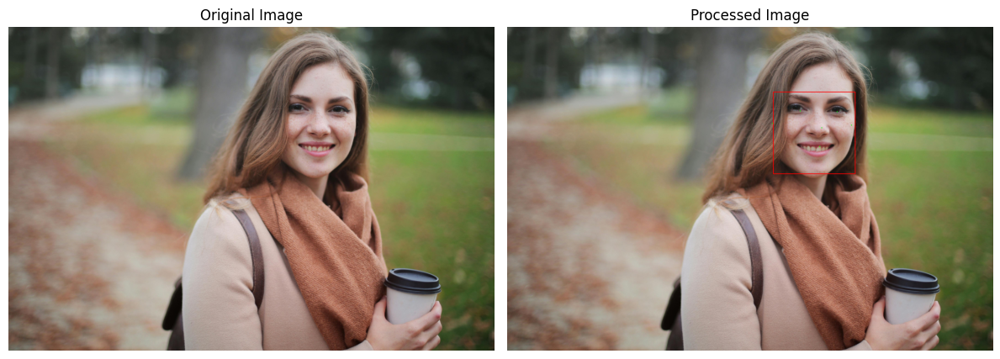

Gambar hasil deteksi disimpan di: /content/drive/MyDrive/Kerja Praktik Internal/TES_FACE DETECTION_MEDIAPIPE/Hasil Tes Image/deteksi_sample10.jpg
[sample2.jpg] Wajah terdeteksi!


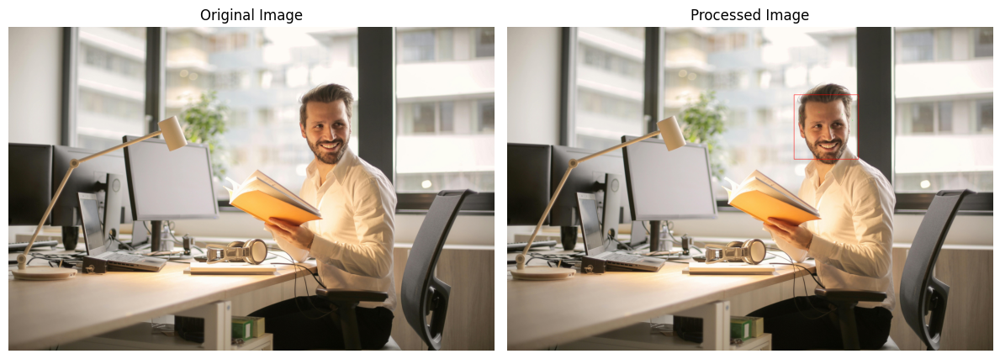

Gambar hasil deteksi disimpan di: /content/drive/MyDrive/Kerja Praktik Internal/TES_FACE DETECTION_MEDIAPIPE/Hasil Tes Image/deteksi_sample2.jpg
[sample9.jpg] Wajah terdeteksi!


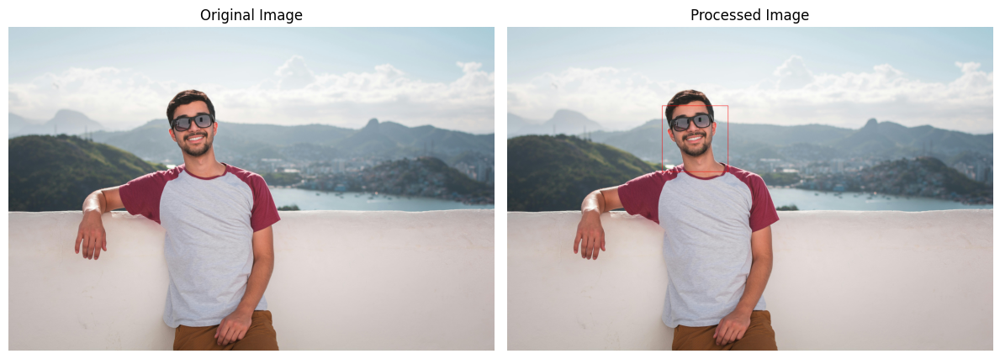

Gambar hasil deteksi disimpan di: /content/drive/MyDrive/Kerja Praktik Internal/TES_FACE DETECTION_MEDIAPIPE/Hasil Tes Image/deteksi_sample9.jpg
[sample3.jpg] Wajah terdeteksi!


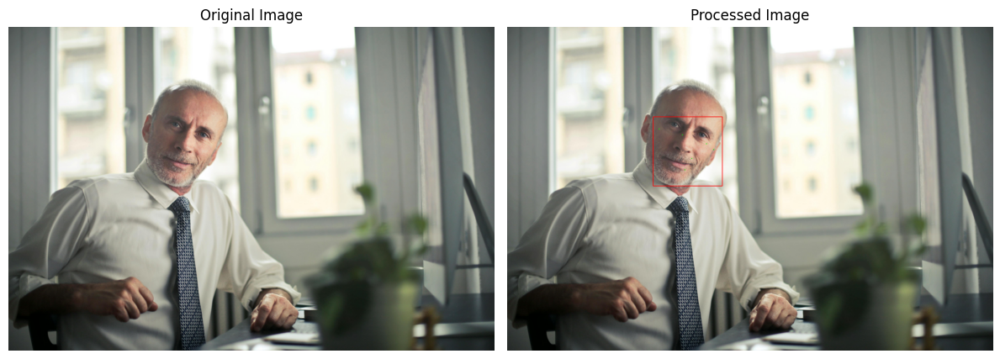

Gambar hasil deteksi disimpan di: /content/drive/MyDrive/Kerja Praktik Internal/TES_FACE DETECTION_MEDIAPIPE/Hasil Tes Image/deteksi_sample3.jpg
[sample8.jpg] Wajah terdeteksi!


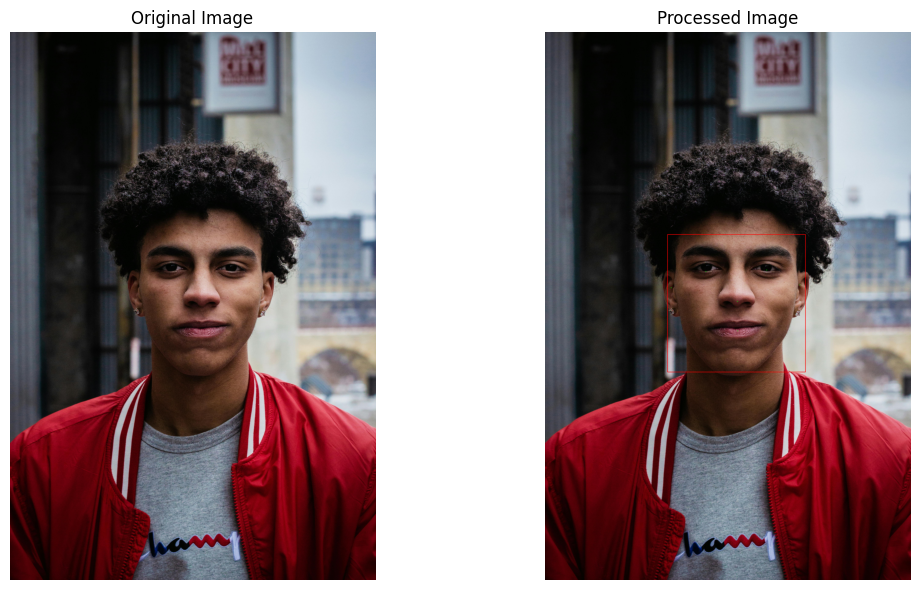

Gambar hasil deteksi disimpan di: /content/drive/MyDrive/Kerja Praktik Internal/TES_FACE DETECTION_MEDIAPIPE/Hasil Tes Image/deteksi_sample8.jpg
[sample6.jpg] Wajah terdeteksi!


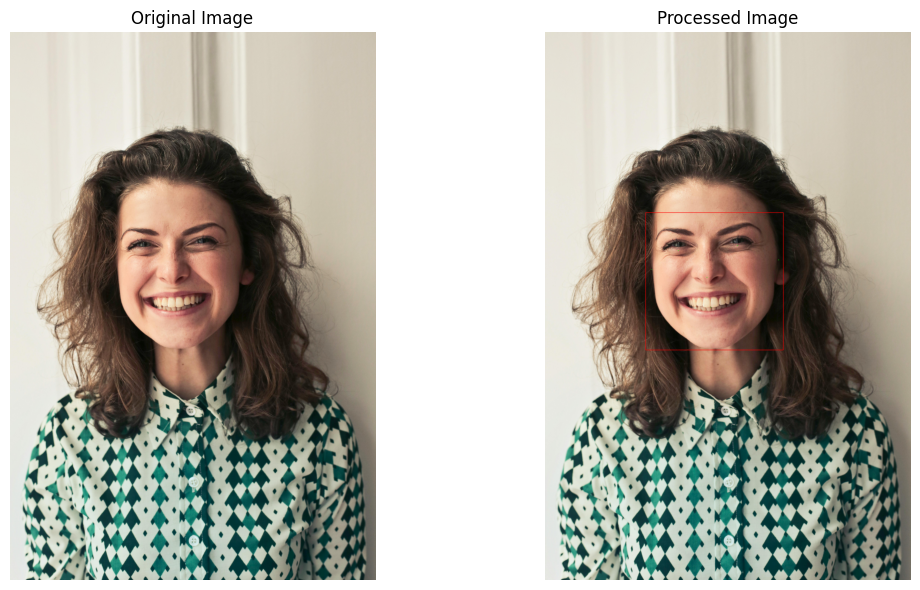

Gambar hasil deteksi disimpan di: /content/drive/MyDrive/Kerja Praktik Internal/TES_FACE DETECTION_MEDIAPIPE/Hasil Tes Image/deteksi_sample6.jpg
[sample5.jpg] Wajah terdeteksi!


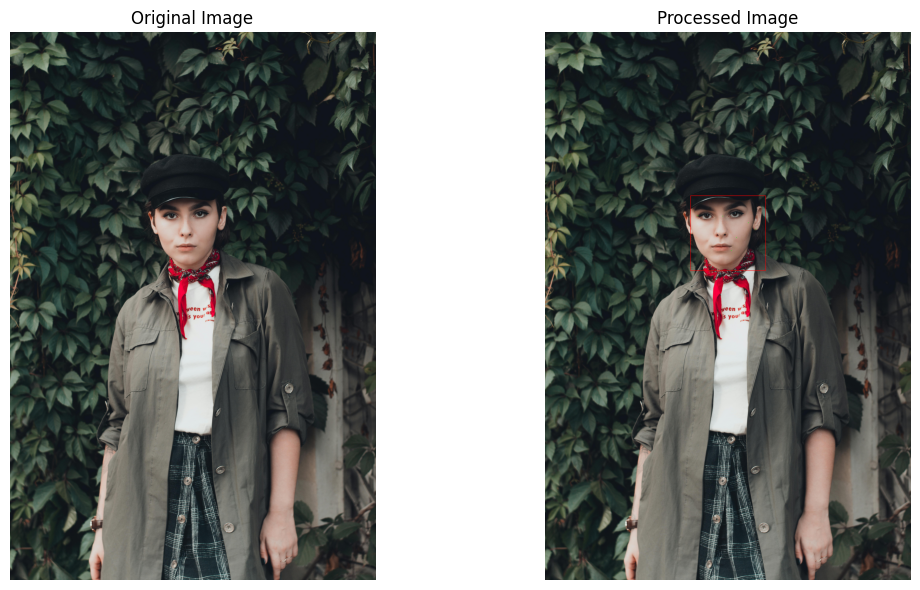

Gambar hasil deteksi disimpan di: /content/drive/MyDrive/Kerja Praktik Internal/TES_FACE DETECTION_MEDIAPIPE/Hasil Tes Image/deteksi_sample5.jpg
[sample4.jpg] Wajah terdeteksi!


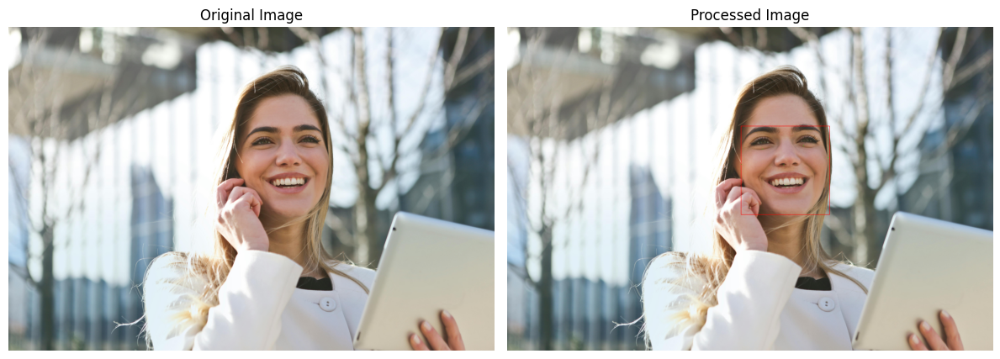

Gambar hasil deteksi disimpan di: /content/drive/MyDrive/Kerja Praktik Internal/TES_FACE DETECTION_MEDIAPIPE/Hasil Tes Image/deteksi_sample4.jpg
[sample1.jpg] Wajah terdeteksi!


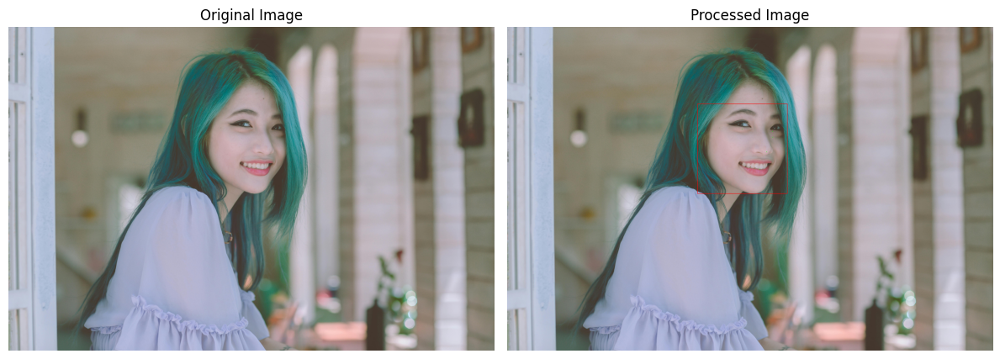

Gambar hasil deteksi disimpan di: /content/drive/MyDrive/Kerja Praktik Internal/TES_FACE DETECTION_MEDIAPIPE/Hasil Tes Image/deteksi_sample1.jpg
[sample7.jpg] Wajah terdeteksi!


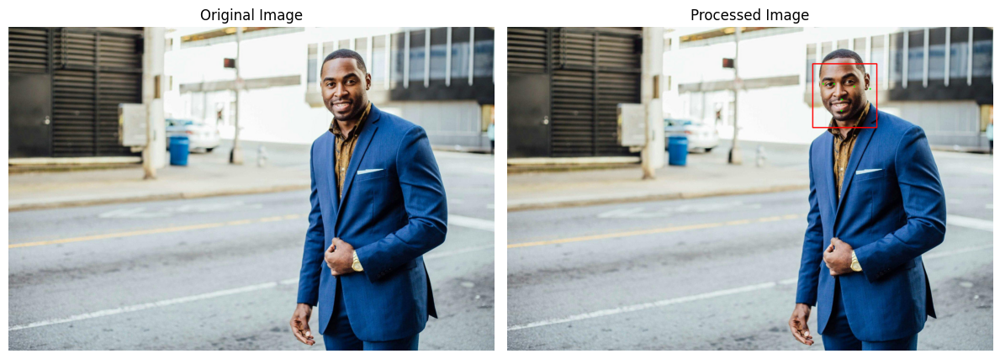

Gambar hasil deteksi disimpan di: /content/drive/MyDrive/Kerja Praktik Internal/TES_FACE DETECTION_MEDIAPIPE/Hasil Tes Image/deteksi_sample7.jpg


In [14]:
fd = FaceDetect()

for in_path, out_path in zip(input_paths, output_paths):
    fd.process_image(in_path, out_path)

# Video Test

In [17]:
import os

input_video_folder = "/content/drive/MyDrive/Kerja Praktik Internal/TES_FACE DETECTION_MEDIAPIPE/Tes Video/"
output_video_folder = "/content/drive/MyDrive/Kerja Praktik Internal/TES_FACE DETECTION_MEDIAPIPE/Hasil Tes Video/"

os.makedirs(output_video_folder, exist_ok=True)

video_files = [f for f in os.listdir(input_video_folder) if f.lower().endswith(('.mp4', '.avi', '.mov', '.mkv'))]

input_video_paths = [os.path.join(input_video_folder, f) for f in video_files]
output_video_paths = [os.path.join(output_video_folder, f"deteksi_{f}") for f in video_files]

fd = FaceDetect()

for in_path, out_path in zip(input_video_paths, output_video_paths):
    fd.process_video(in_path, out_path)


[sample1.mp4] Wajah terdeteksi!
Video hasil deteksi disimpan di: /content/drive/MyDrive/Kerja Praktik Internal/TES_FACE DETECTION_MEDIAPIPE/Hasil Tes Video/deteksi_sample1.mp4
[sample3.mp4] Wajah terdeteksi!
Video hasil deteksi disimpan di: /content/drive/MyDrive/Kerja Praktik Internal/TES_FACE DETECTION_MEDIAPIPE/Hasil Tes Video/deteksi_sample3.mp4
[sample2.mp4] Wajah terdeteksi!
Video hasil deteksi disimpan di: /content/drive/MyDrive/Kerja Praktik Internal/TES_FACE DETECTION_MEDIAPIPE/Hasil Tes Video/deteksi_sample2.mp4
[sample4.mp4] Wajah terdeteksi!
Video hasil deteksi disimpan di: /content/drive/MyDrive/Kerja Praktik Internal/TES_FACE DETECTION_MEDIAPIPE/Hasil Tes Video/deteksi_sample4.mp4
[sample5.mp4] Wajah terdeteksi!
Video hasil deteksi disimpan di: /content/drive/MyDrive/Kerja Praktik Internal/TES_FACE DETECTION_MEDIAPIPE/Hasil Tes Video/deteksi_sample5.mp4
[sample6.mp4] Wajah terdeteksi!
Video hasil deteksi disimpan di: /content/drive/MyDrive/Kerja Praktik Internal/TES_FACE 

# Stream Test

In [18]:
def run_inference_on_stream(stream_url):
    detector_stream = FaceDetect(detection_confidence=0.5)
    cap = cv2.VideoCapture(stream_url)

    if not cap.isOpened():
        print("Error: Tidak dapat membuka video stream. Pastikan URL benar dan dapat diakses.")
        return

    print("Stream berhasil dibuka. Memulai deteksi wajah...")
    print("Untuk menghentikan, klik tombol 'Stop' (Interrupt execution) di Google Colab.")

    while True:
        try:
            success, frame = cap.read()
            if not success:
                print("Gagal mengambil frame dari stream. Mungkin stream terputus. Mencoba lagi...")
                cap.release()
                cap = cv2.VideoCapture(stream_url)
                time.sleep(2)
                continue

            processed_frame, faces_found = detector_stream._process_frame(frame)

            if faces_found:
                cv2.putText(processed_frame, "Status: Wajah Terdeteksi", (10, 30),
                            cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 2)
            else:
                cv2.putText(processed_frame, "Status: Wajah Tidak Terdeteksi", (10, 30),
                            cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2)

            cv2_imshow(processed_frame)

        except KeyboardInterrupt:
            print("Proses dihentikan oleh pengguna.")
            break
        except Exception as e:
            print(f"Terjadi error: {e}")
            break

    cap.release()
    print("Stream dilepaskan.")

Stream berhasil dibuka. Memulai deteksi wajah...
Untuk menghentikan, klik tombol 'Stop' (Interrupt execution) di Google Colab.


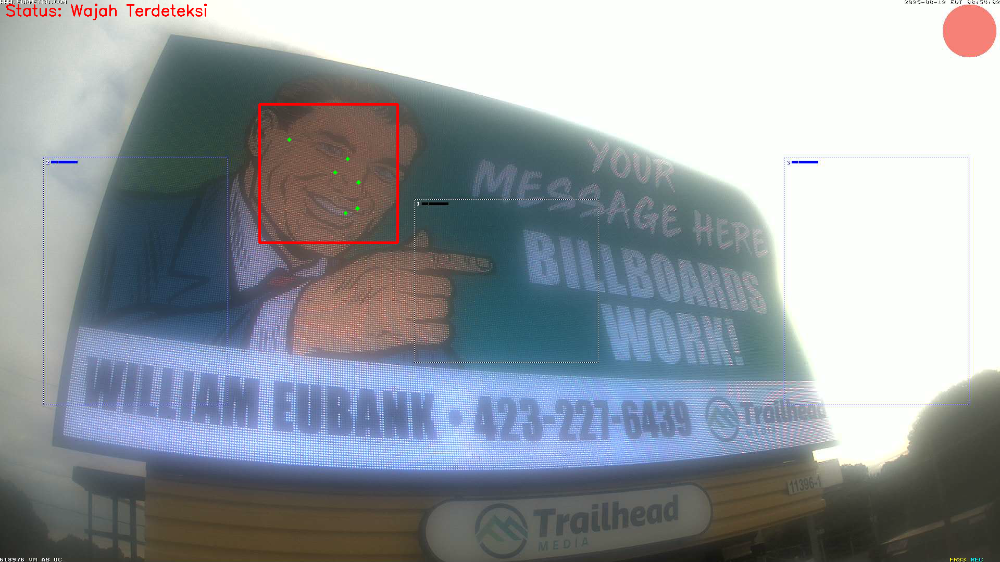

Gagal mengambil frame dari stream. Mungkin stream terputus. Mencoba lagi...


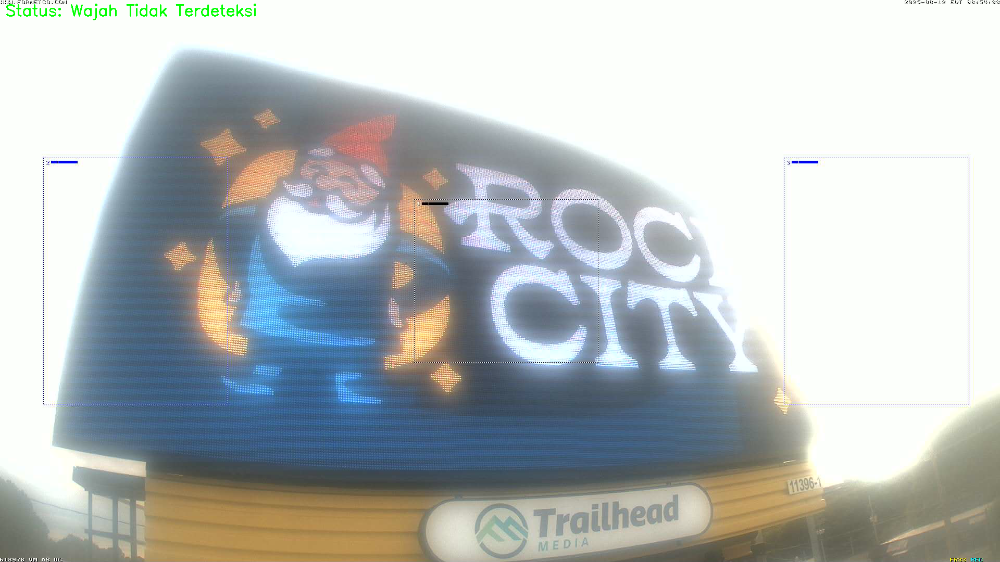

Gagal mengambil frame dari stream. Mungkin stream terputus. Mencoba lagi...


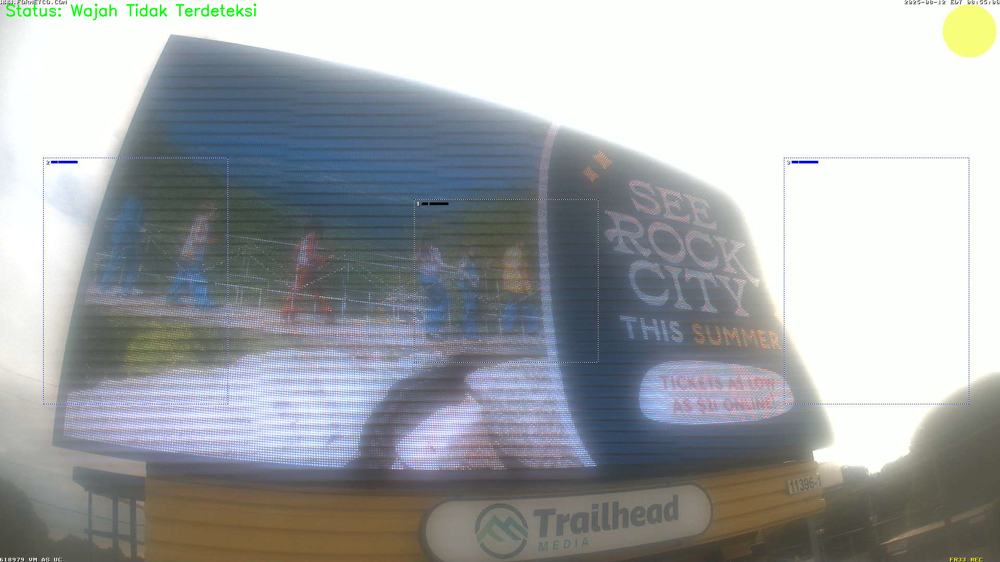

Gagal mengambil frame dari stream. Mungkin stream terputus. Mencoba lagi...


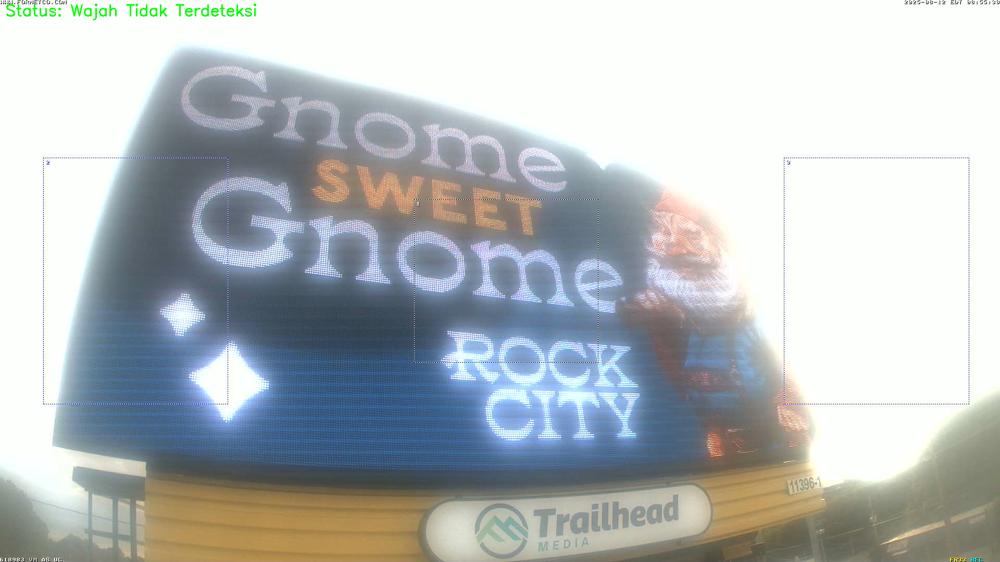

Gagal mengambil frame dari stream. Mungkin stream terputus. Mencoba lagi...


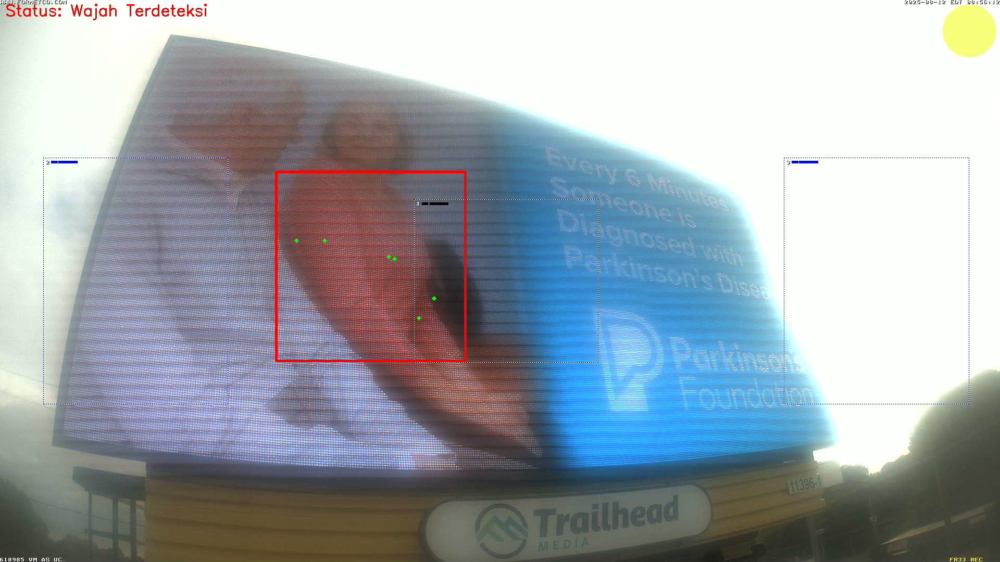

Gagal mengambil frame dari stream. Mungkin stream terputus. Mencoba lagi...


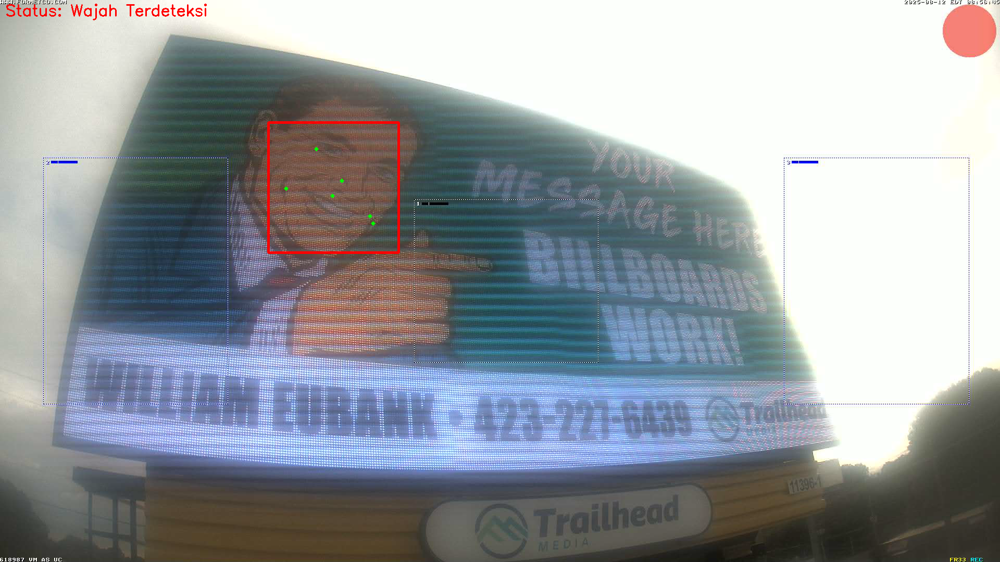

Proses dihentikan oleh pengguna.
Stream dilepaskan.


In [21]:
stream_url = "http://162.191.83.93:81/cgi-bin/faststream.jpg?stream=half&fps=15&rand=COUNTER"
run_inference_on_stream(stream_url)